# Libs

In [1]:
%matplotlib inline

import os

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import skimage

import cv2

# 2d spectrum of an image

In [2]:
bacteria = cv2.imread('../pictures/test_input_1.bmp')

In [3]:
bacteria.shape

(1216, 1616, 3)

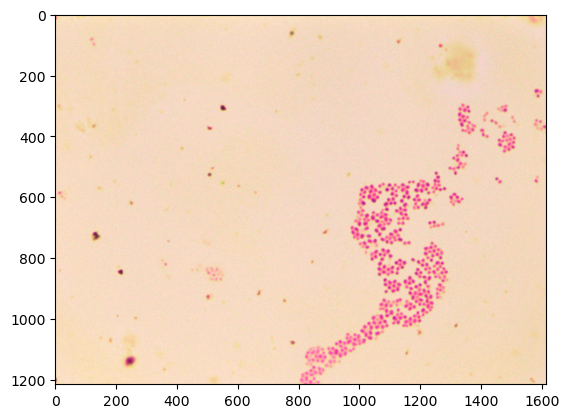

In [4]:
plt.imshow(bacteria[:,:,::-1])
plt.show()

In [5]:
image_fft = np.fft.fft2(bacteria, axes=(0,1))

## Specrums for RGB

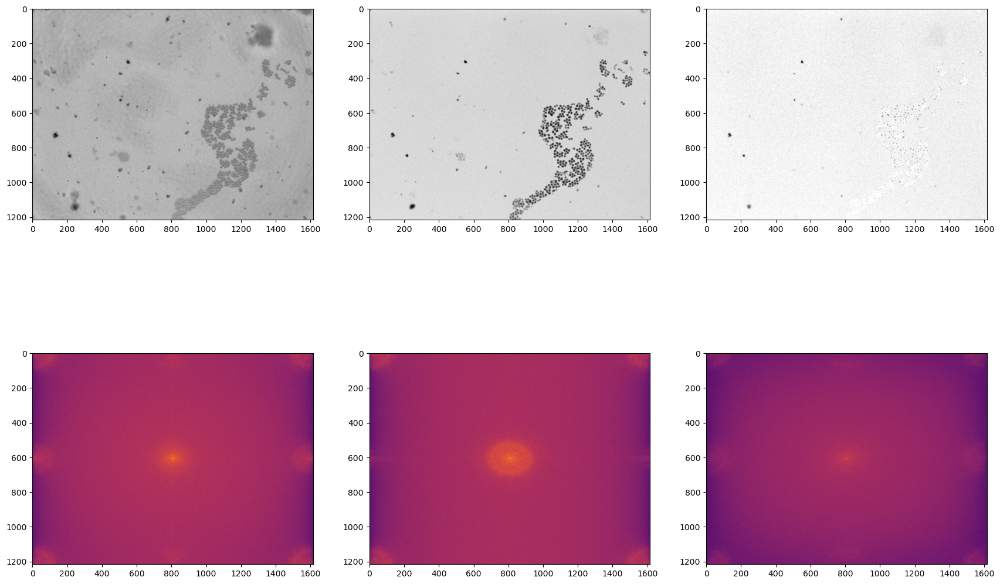

In [6]:
fig, ax = plt.subplots(2, 3, figsize=(21,14))

for i in range(3):
    ax[0][i].imshow(bacteria[:,:,i], cmap = "gray")

for i in range(3):
    ax[1][i].imshow(np.log10(np.abs(np.fft.fftshift(image_fft[:,:,i]))**2)+1, cmap='inferno')

plt.show()

## Spectrums for YUV

In [7]:
bacteria_yuv = cv2.cvtColor(bacteria, cv2.COLOR_BGR2YUV)
bacteria_yuv_fft = np.fft.fft2(bacteria_yuv, axes=(0,1))

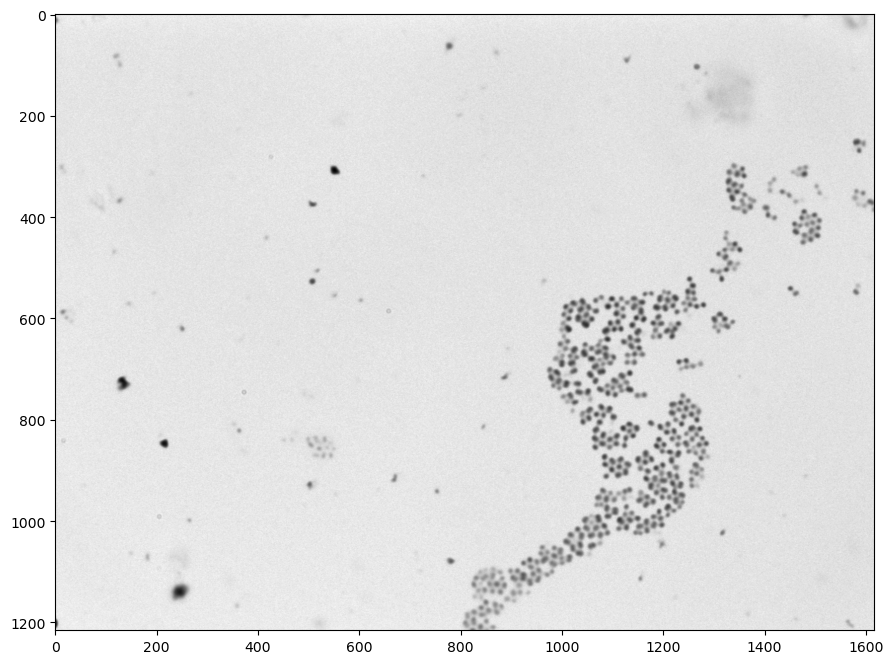

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))

plt.imshow(bacteria_yuv[:,:,0], cmap='gray')
plt.show()

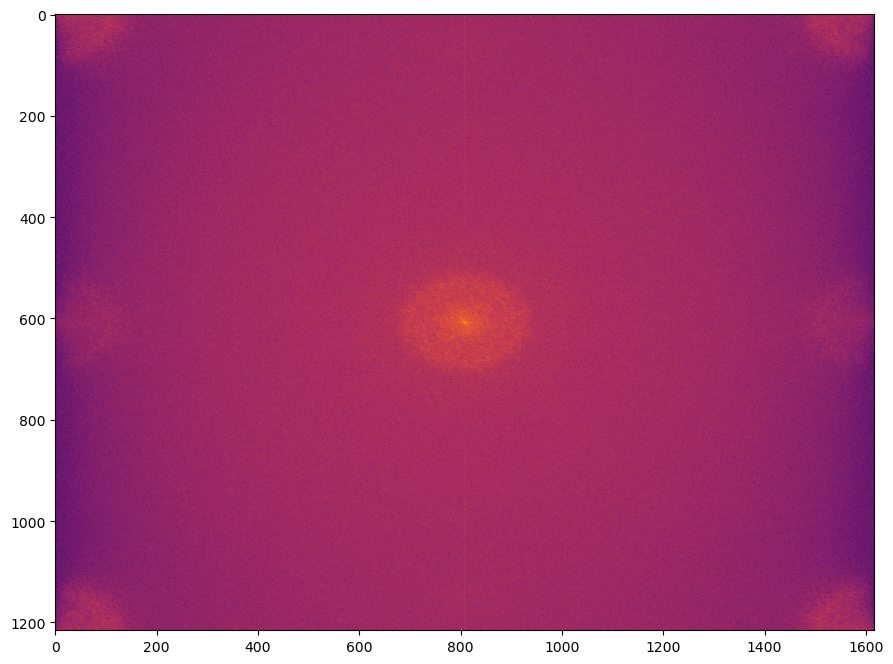

In [9]:
bacteria_yuv_fft = np.fft.fft2(bacteria_yuv, axes=(0,1))

fig, ax = plt.subplots(1, 1, figsize=(12,8))
plt.imshow(np.log(np.abs(np.fft.fftshift(bacteria_yuv_fft[:,:,i]))**2)+1, cmap='inferno')
plt.show()

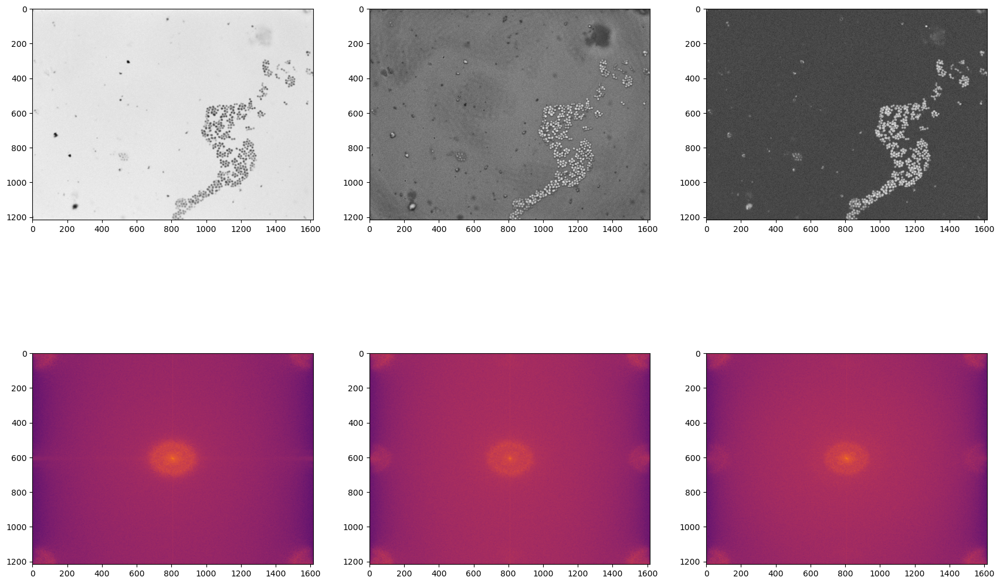

In [10]:
fig, ax = plt.subplots(2, 3, figsize=(21,14))

for i in range(3):
    ax[0][i].imshow(bacteria_yuv[:,:,i], cmap = "gray")

for i in range(3):
    ax[1][i].imshow(np.log(np.abs(np.fft.fftshift(bacteria_yuv_fft[:,:,i]))**2)+1, cmap='inferno')

plt.show()

## Filtering image and inspecting its spectrum

In [11]:
# image_out = skimage.filters.unsharp_mask(bacteria, channel_axis=2)[:,:,::-1]
image_out = skimage.filters.gaussian(bacteria, channel_axis=2)[:,:,::-1]
# image_out = cv2.bilateralFilter(bacteria, d=5, sigmaColor=40, sigmaSpace=40)[:,:,::-1]
# image_out = skimage.filters.butterworth(bacteria, cutoff_frequency_ratio = 0.16, high_pass = False, order=3, npad=32, channel_axis=2)[:,:,::-1]

cv2.imwrite("../pictures/test_output_1_gaussian.bmp", cv2.cvtColor(cv2.normalize(image_out, None, 255, 0, cv2.NORM_MINMAX, cv2.CV_8U), cv2.COLOR_BGR2RGB))

True

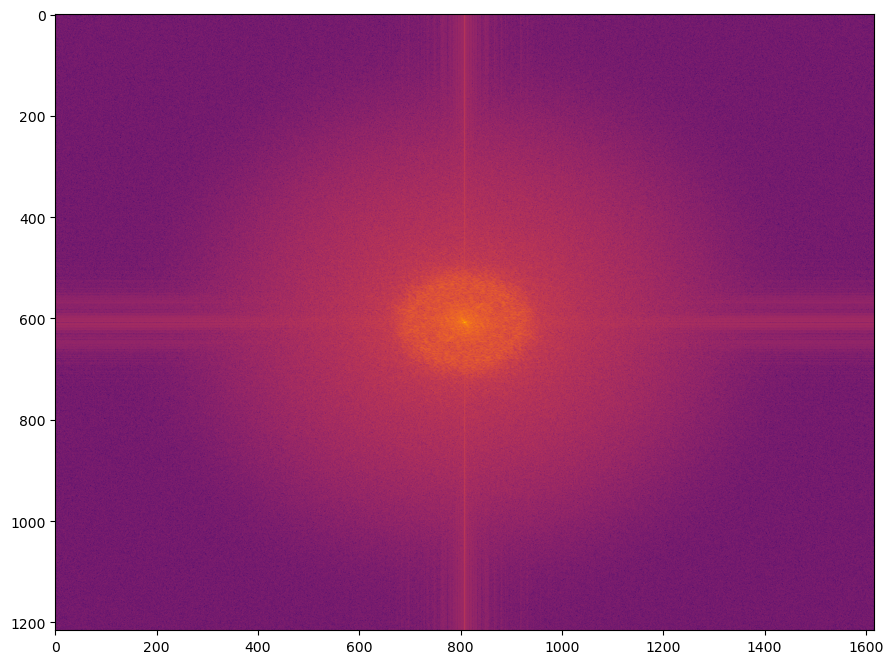

In [12]:
bacteria = cv2.imread('../pictures/test_output_1_gaussian.bmp')

bacteria_fft = np.fft.fft2(bacteria, axes=(0,1))

fig, ax = plt.subplots(1, 1, figsize=(12,8))
plt.imshow(np.log(np.abs(np.fft.fftshift(bacteria_fft[:,:,1]))**2)+1, cmap = 'inferno')
plt.show()

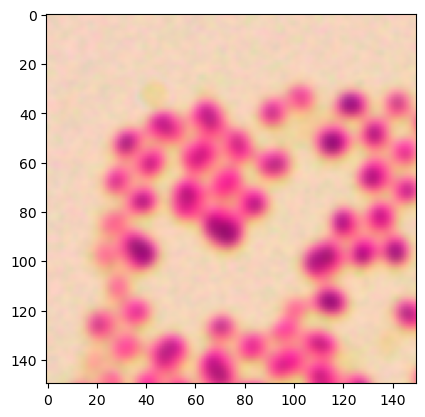

In [13]:
bacteria_filtered = cv2.imread('../pictures/test_output_1_gaussian.bmp')

plt.imshow(bacteria_filtered[525:675,975:1125,::-1])
plt.show()

# 2x2 grid testing

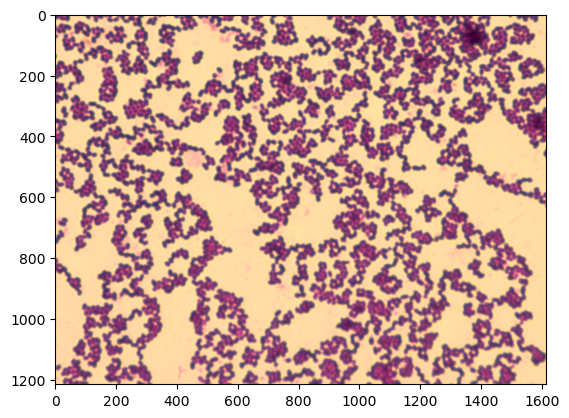

In [14]:
bacteria = cv2.imread('../pictures/test_input_4.bmp')

plt.imshow(bacteria[:,:,::-1])
plt.show()

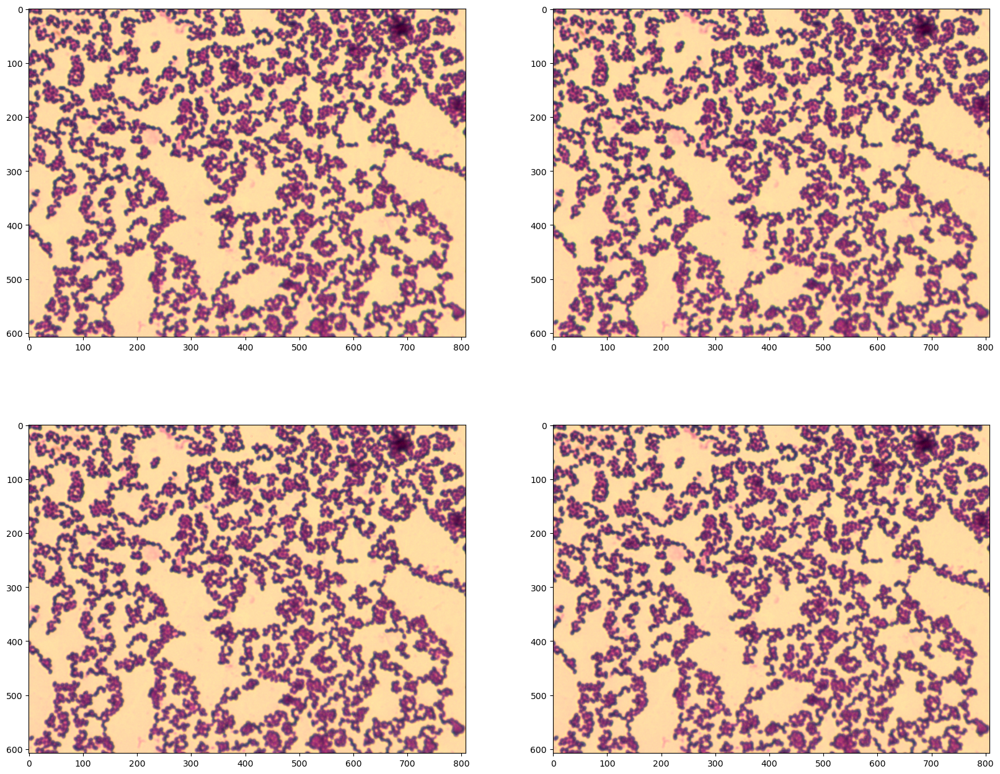

In [15]:
fig, ax = plt.subplots(2, 2, figsize = (20, 16))
for i in range(4):
    ax[i//2][i%2].imshow(bacteria[i//2::2,i%2::2,::-1])
    
plt.show()

In [16]:
for i in range(4):
    cv2.imwrite(f"../pictures/test_output_4_clipped_{i//2}_{i%2}.bmp", cv2.cvtColor(cv2.normalize(bacteria[i//2::2,i%2::2,::-1],
                                                                                       None, 255, 0, cv2.NORM_MINMAX, cv2.CV_8U), cv2.COLOR_BGR2RGB))

## 2x2 average pool and resizing

In [17]:
bacteria = cv2.imread('../pictures/test_input_1.bmp')

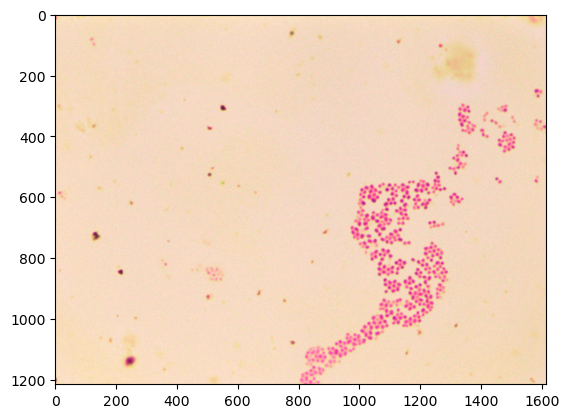

In [18]:
plt.imshow(bacteria[:,:,::-1])
plt.show()

In [19]:
bacteria_downscaled = np.round(np.uint8(skimage.measure.block_reduce(bacteria, (2,2,1), np.mean, func_kwargs={'dtype': np.float16})))

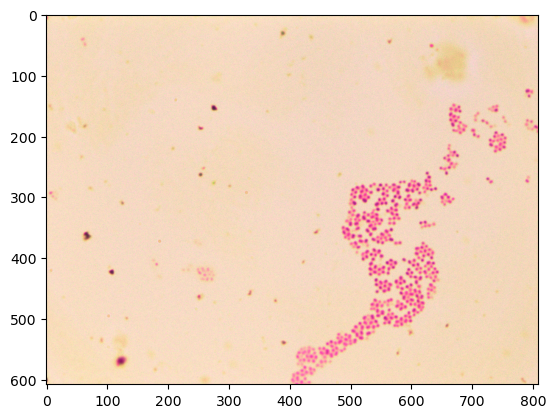

In [20]:
plt.imshow(bacteria_downscaled[:,:,::-1])
plt.show()

In [21]:
bacteria_downscaled_upscaled = cv2.resize(bacteria_downscaled,
                                           bacteria.shape[:-1][::-1], interpolation = cv2.INTER_CUBIC)

In [22]:
cv2.imwrite(f"../pictures/test_output_1_aver_pool_rescaled.bmp", cv2.cvtColor(cv2.normalize(bacteria_downscaled_upscaled[:,:,::-1],
                                                                                       None, 255, 0, cv2.NORM_MINMAX, cv2.CV_8U), cv2.COLOR_BGR2RGB))

True